In [1]:
% matplotlib inline 

import nibabel as nib
import nibabel.gifti
import nilearn
from nilearn import datasets, plotting
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
mpl.rcParams['svg.fonttype'] = 'none'

import sys
sys.path.append('gradient_data/src/')
from viz import *

/Applications/miniconda3/envs/topography/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


# Visualization on human cortical surface

In [73]:
import h5py, sys, io, numpy as np
import nibabel as nib 

surfmL = nib.freesurfer.read_geometry('gradient_data/templates/Q1-Q6_R440.L.midthickness.32k_fs_LR.surf')
surfiL = nib.freesurfer.read_geometry('gradient_data/templates/Q1-Q6_R440.L.very_inflated.32k_fs_LR.surf')
surfL = []
surfL.append(np.array(surfmL[0]*0.3 + surfiL[0]*0.7))
surfL.append(surfmL[1])

surfmR = nib.freesurfer.read_geometry('gradient_data/templates/Q1-Q6_R440.R.midthickness.32k_fs_LR.surf')
surfiR = nib.freesurfer.read_geometry('gradient_data/templates/Q1-Q6_R440.R.very_inflated.32k_fs_LR.surf')
surfR = []
surfR.append(np.array(surfmR[0]*0.3 + surfiR[0]*0.7))
surfR.append(surfmR[1])

sulcL = -1 * nib.load('gradient_data/templates/Q1-Q6_R440.sulc.32k_fs_LR.dscalar.nii').data[0:32492]
sulcR = -1 * nib.load('gradient_data/templates/Q1-Q6_R440.sulc.32k_fs_LR.dscalar.nii').data[32492:32492*2]

res = nib.load('gradient_data/templates/hcp.embed.all.179.lh.dscalar.nii').data
cortL = np.squeeze(np.array(np.where(res != 0)[0], dtype=np.int32))
res = nib.load('gradient_data/templates/hcp.embed.all.179.rh.dscalar.nii').data
cortR = np.squeeze(np.array(np.where(res != 0)[0], dtype=np.int32))
cortLen = len(cortL) + len(cortR)
del res

pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [3]:
# Extract yeo7 colors:

yeo7L = nib.gifti.read('gradient_data/templates/hcp.RSN.L.gii').darrays[0].data
yeo7R = nib.gifti.read('gradient_data/templates/hcp.RSN.R.gii').darrays[0].data
yeo7 = np.concatenate((yeo7L[cortL], yeo7L[cortR]))
uniqueY = np.unique(yeo7)
convertYeo7 = [2,5,6,0,4,1,3] 
cols7 = ((255,255,255),
         (120,  18, 134),
         (70 ,130, 180),
         ( 0 ,118 , 14),
         (196 , 58 ,250),
         (220 ,248 ,164),
         (230, 148,  34),
         (205 , 62,  78 ))
cols = np.asarray(cols7, dtype=float)/255
yeoCols = ListedColormap(cols,name='colormapYeo')
y = yeo7.copy()
for n,x in enumerate(uniqueY):
    if x == 37.:
        y[yeo7 == 37] = - 4
    else:
        y[yeo7 == x] = int(convertYeo7[n-1]) - 3
y = (y + 4) / 7
c = [yeoCols(y[x]) for x in range(cortLen)]    

# Visualize surfaces

In [4]:
# Load embedding results
emb = np.load('gradient_data/embedded/embedding_dense_cosine_emb.npy')

In [22]:
dataL = np.zeros((len(surfL[0]), emb.shape[1]))
dataL[cortL,:] = emb[0:len(cortL),:]
dataR = np.zeros((len(surfR[0]), emb.shape[1]))
dataR[cortR,:] = emb[len(cortL):cortLen,:]

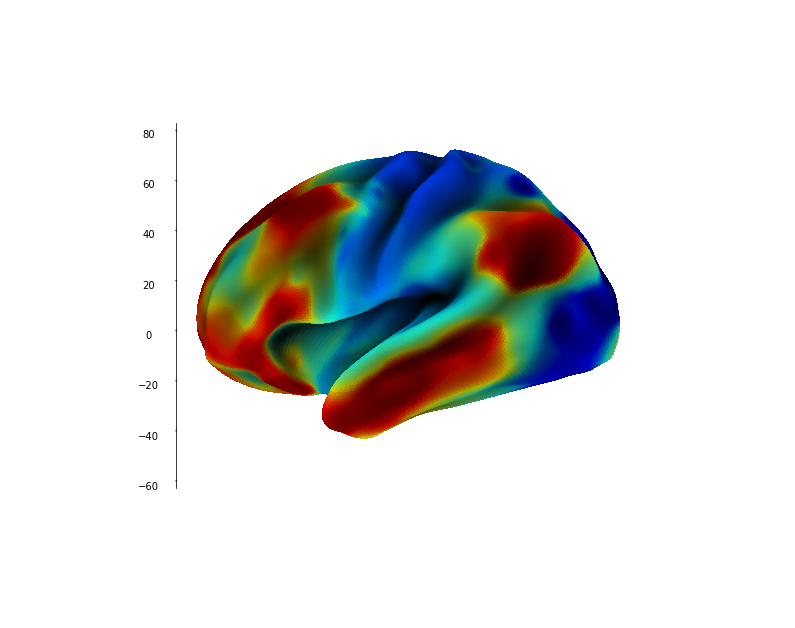

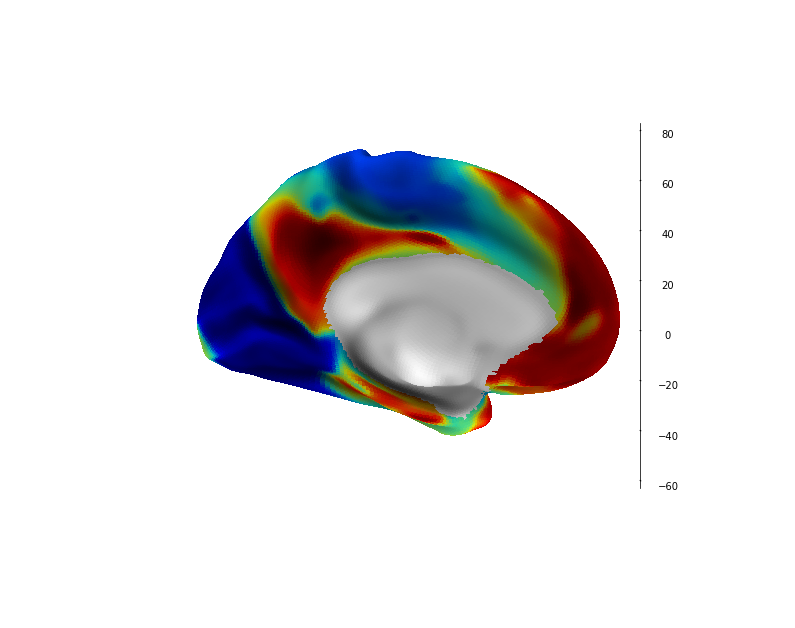

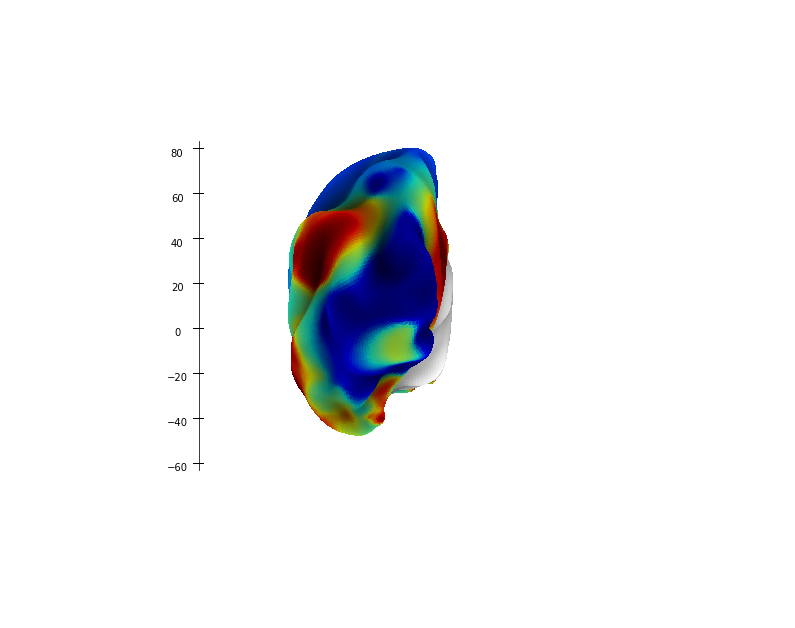

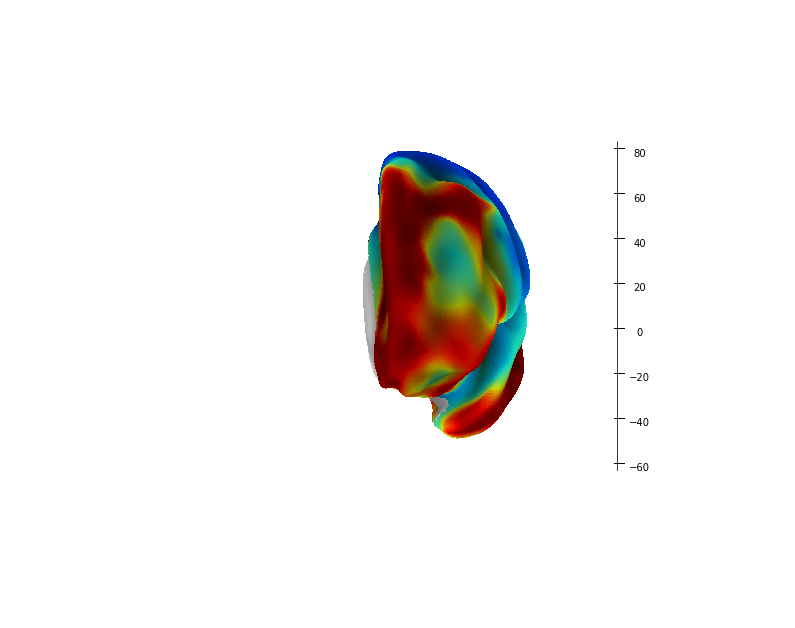

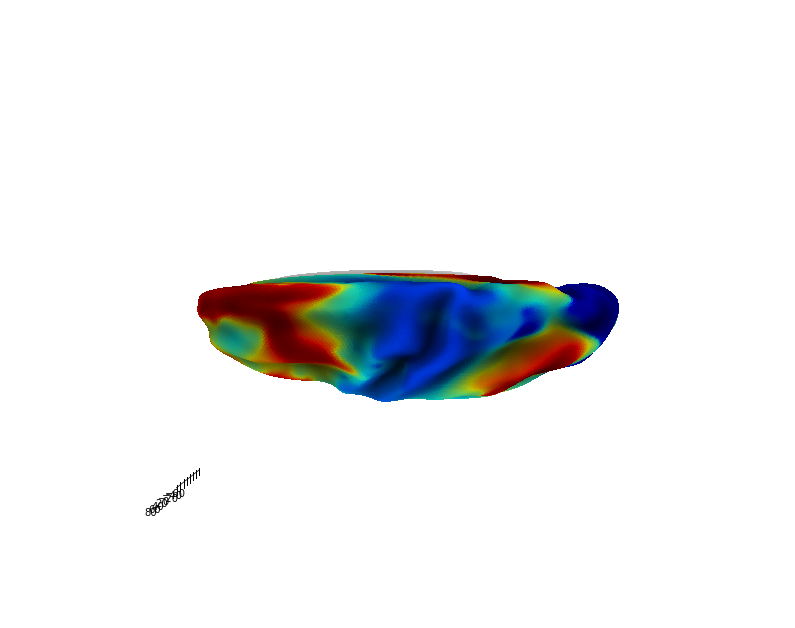

...

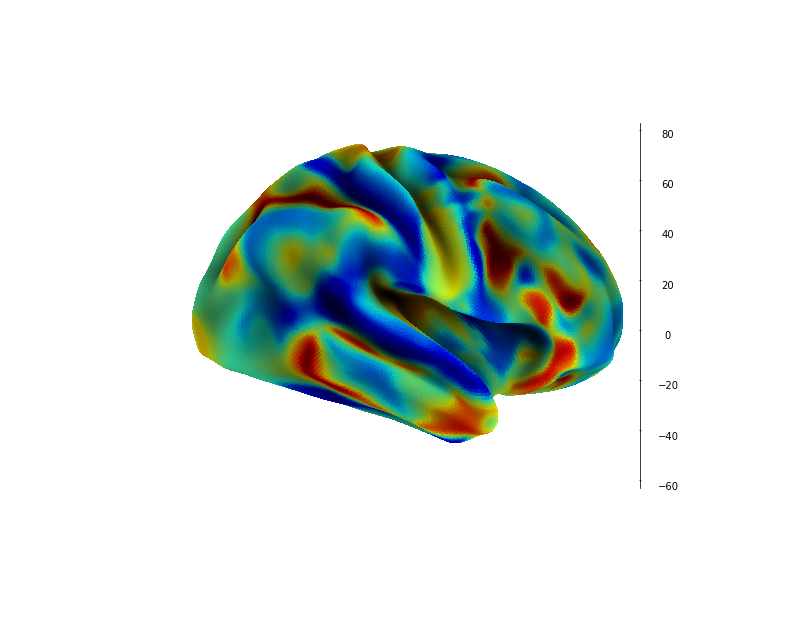

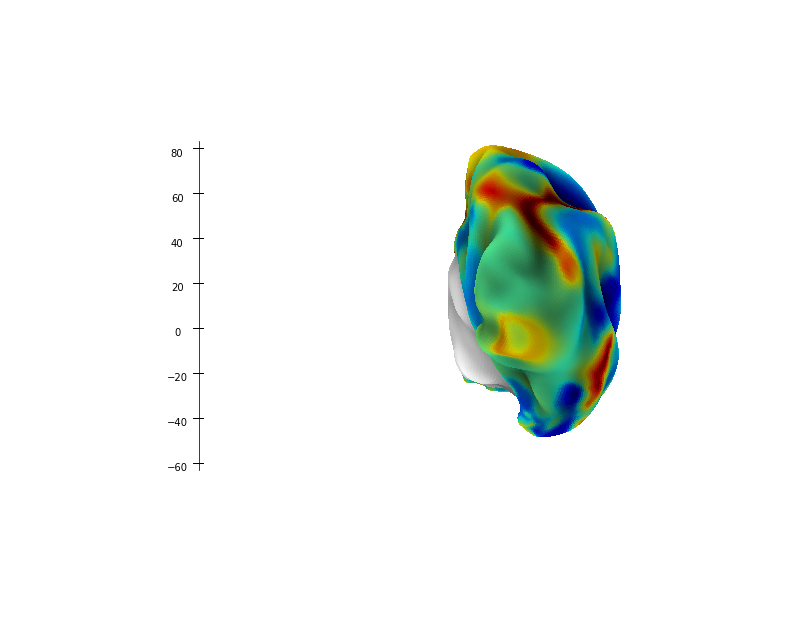

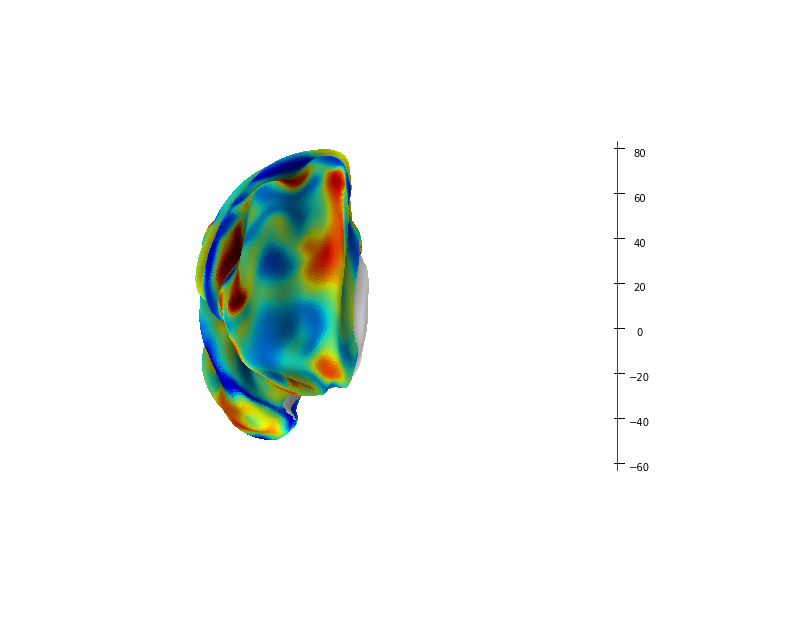

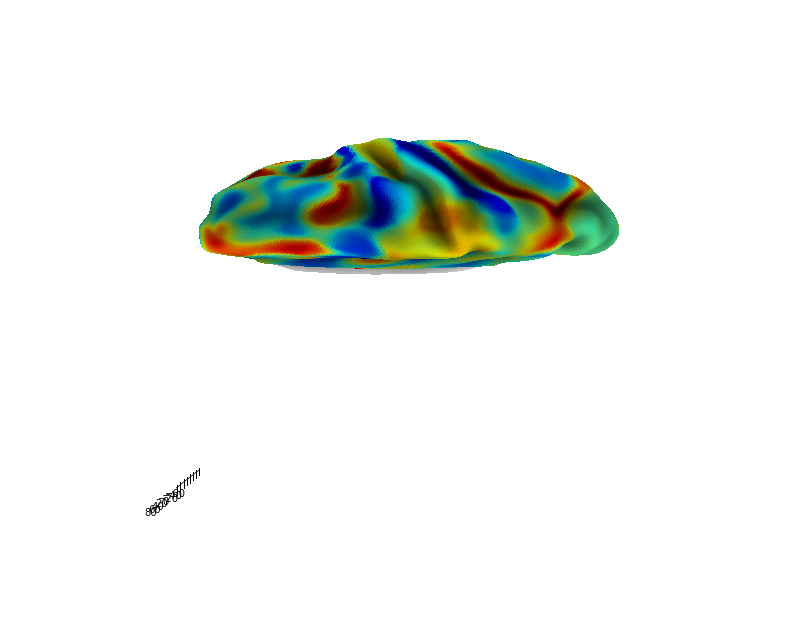

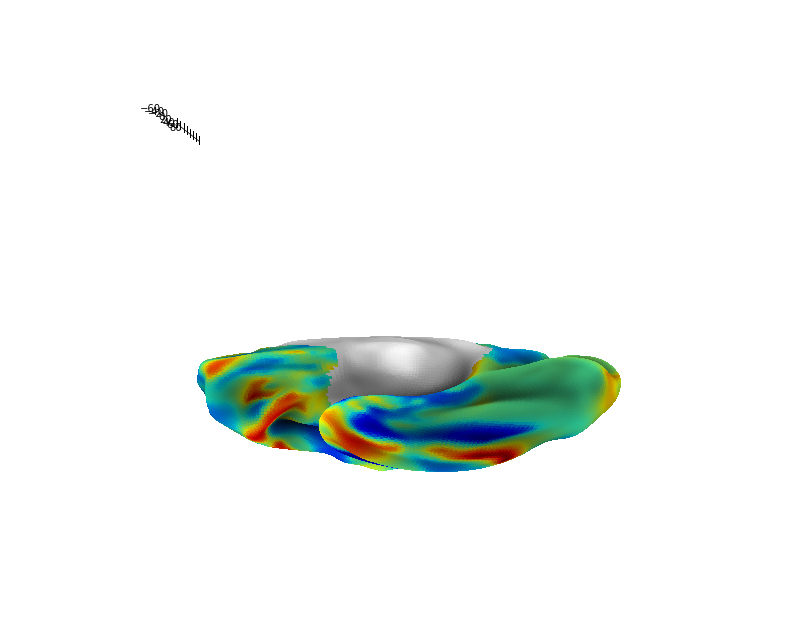

In [25]:
for i in range(emb.shape[1]):
    showSurf(dataL[:,i].squeeze(), surfL, sulcL, cortL, showall=True, output_file='gradient_data/figures/embedded/fig.hcp.embed.%i.L' % i)
    showSurf(dataR[:,i].squeeze(), surfR, sulcR, cortR, showall=True, output_file='gradient_data/figures/embedded/fig.hcp.embed.%i.R' % i)        

## Scatterplot of first two dimensions

In [36]:
sns.set(style="white")
sns.set_context("notebook", font_scale=1.5)

df = pd.DataFrame()
df['e0'] = np.array(emb[range(cortLen),0])
df['e1'] = np.array(emb[range(cortLen),1]) * -1 # to reorient plot
df['e2'] = np.array(emb[range(cortLen),2])

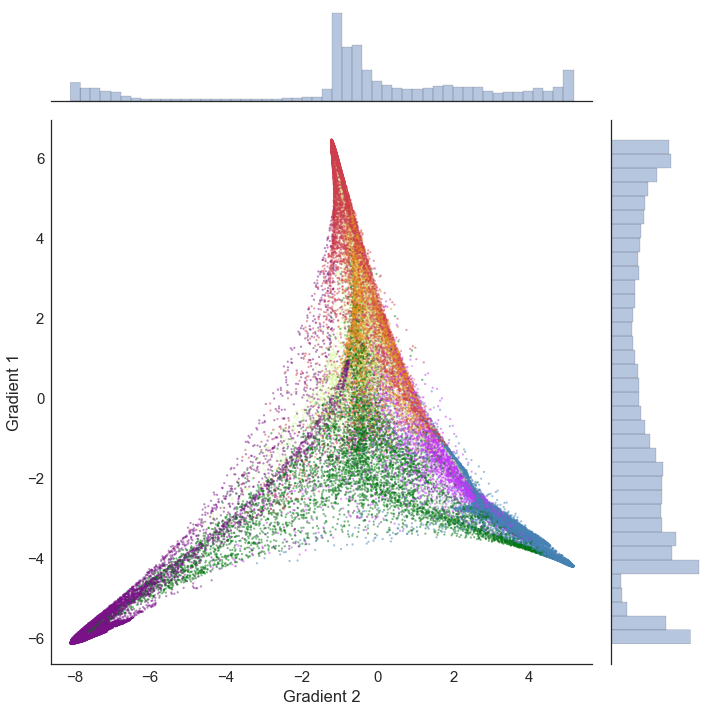

In [43]:
g = (sns.jointplot('e1', 'e0', 
                   data=df, 
                   size=10, label='big', linewidth=0, marker='.', c=np.array(c), alpha=0.5,
                   ylim = [np.min(df['e0']) - 0.5, np.max(df['e0']) + 0.5], 
                   xlim=[np.min(df['e1']) - 0.5, np.max(df['e1']) + 0.5],
                   stat_func=None).set_axis_labels('Gradient 2', 'Gradient 1'))

g.savefig('gradient_data/figures/fig.components.scatterplot.grad1.grad2.svg', format='svg')

In [ ]:
g = (sns.jointplot('e0', 'e2', 
                   data=df, 
                   size=10, label='big', linewidth=0, marker='.', c=np.array(c), 
                   stat_func=None).set_axis_labels('Gradient 1', 'Gradient 3'))

g.savefig('gradient_data/figures/fig.components.scatterplot.grad2.grad3.svg', format='svg')

# Macaque monkey connectivity data gradients

In [2]:
import numpy as np
import scipy as sp
import scipy.io

atlases = {'rm': 0, 'lv': 1, 'fv': 3, 'b05': 4, 'bb47': 5, 'pht00': 7}

# Load surfaces

mat = sp.io.loadmat('gradient_data/macaque/f99_vertices_faces.mat')
vertices = np.array(mat['vertices'], dtype=np.float64)
triangles = np.array(mat['faces'] - 1, dtype=np.int32)
# sulc = np.array(pd.read_csv('gradient_data/macaque/surf.sulc.asc', ' ', header=-1)[4]) * -1.
# nib.freesurfer.write_geometry('gradient_data/macaque/rh.pial', vertices, triangles)
# ! mris_inflate -sulc sulc -n 15 rh.pial inflated
sulc = nib.freesurfer.read_morph_data('gradient_data/macaque/rh.sulc') * -1
nodes = pd.read_csv('gradient_data/macaque/nodes_areaids.txt', '\t', header=-1)

def getIds(mat_name, names):
    
    lex = pd.read_csv('gradient_data/macaque/ids_areas.txt', ' ', header=-1)[1]

    ids = np.zeros(len(names))
    for i,y in enumerate(names):
        for n,x in enumerate(lex):
            if x == y:
                ids[i] = n
    return ids

def project_to_surface(mat_name, names, emb_comp):
    
    idx = getIds(mat_name, names)
    comp = emb_comp
    data = np.zeros(len(vertices))
    for n, x in enumerate(idx):
        if x != 0:
            data[np.where(nodes[atlases.get(mat_name)] == x)] = comp[n]
    data = np.squeeze(data)
    
    return data

def visualize_macaque(mat_name, comp):
    emb = np.load('gradient_data/conn_matrices/macaque_%s_emb.npy' % mat_name)
    names = np.load('gradient_data/conn_matrices/macaque_%s_names.npy' % mat_name)

    data = project_to_surface(mat_name, names, emb[:,comp])

    f = plot_surf_stat_map(vertices, triangles, bg_map=sulc, stat_map=data, mask=np.where(nodes[0] != 0.)[0], 
                       bg_on_stat=True, azim=10, elev=20, label=True, lenient=True)
    plt.show()
    f = plot_surf_stat_map(vertices, triangles, bg_map=sulc, stat_map=data, mask=np.where(nodes[0] != 0.)[0], 
                       bg_on_stat=True, azim=180, elev=20, label=True, lenient=True)
    plt.show()

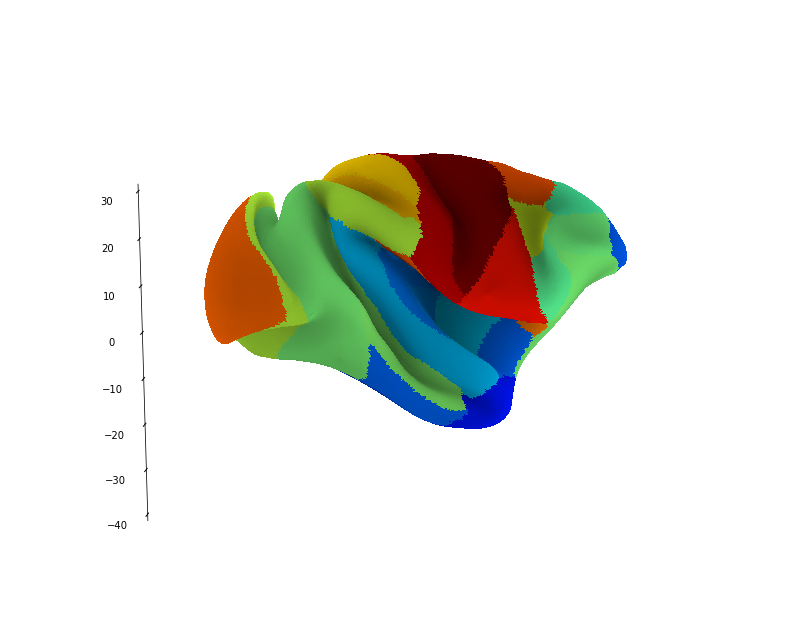

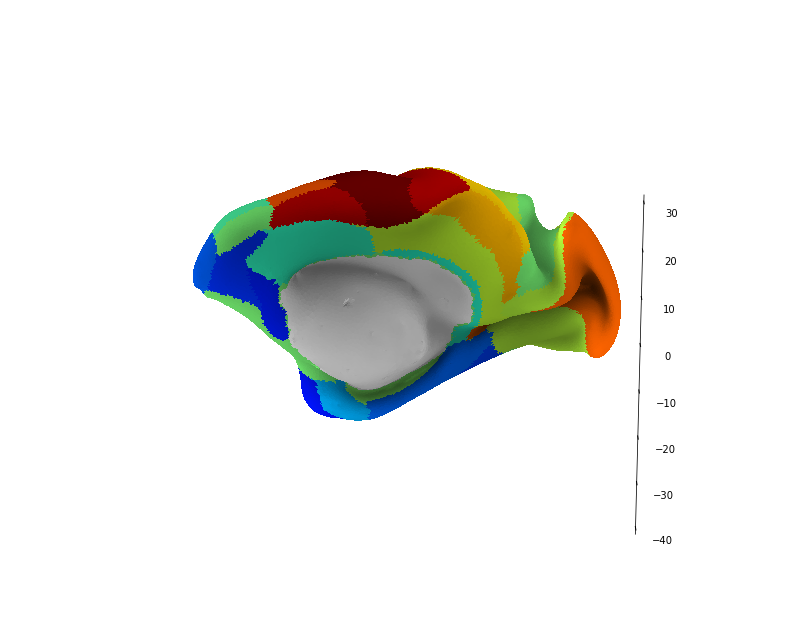

In [ ]:
visualize_macaque('rm', 0) 

In [ ]:
visualize_macaque('fv', 0) 

In [ ]:
visualize_macaque('b05', 0)

In [ ]:
visualize_macaque('bb47', 0)